## Note that plotly's interactive graphics are not visible on github, only a chart's preview is being shown

In [1]:
#!pip install -U kaleido

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from pandas.plotting import scatter_matrix
%matplotlib inline
from IPython.display import Image

In [3]:
cols = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity']

In [4]:
house = pd.read_csv('https://raw.githubusercontent.com/ageron/handson-ml/master/datasets/housing/housing.tgz',
                    compression='gzip')
house.columns = cols

In [5]:
house.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [6]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20641 entries, 0 to 20640
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


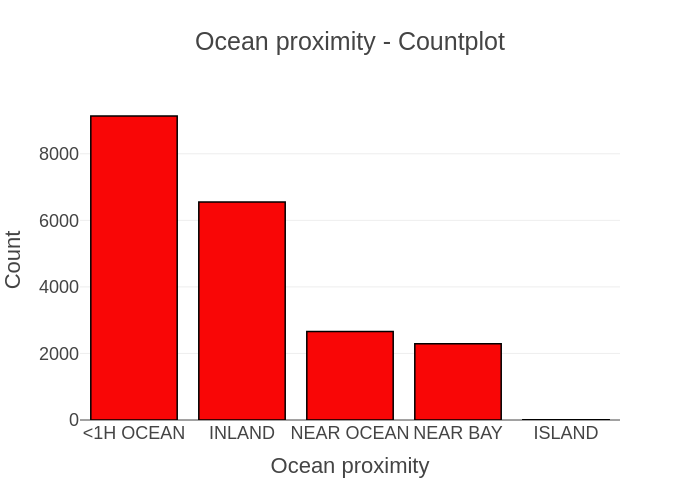

In [7]:
ocean_proximity = pd.DataFrame(house.ocean_proximity.value_counts())
ocean_proximity = ocean_proximity.reset_index()
ocean_proximity.columns = ['ocean_proximity','count']
ocean_proximity.sort_values('count',ascending=False,inplace=True)

ocean_proximity_ = go.Bar(
                    x=ocean_proximity['ocean_proximity'], 
                    y=ocean_proximity["count"], 
                    name="Movies", 
                    marker=dict(color = 'rgb(249, 6, 6)',
                             line=dict(color='rgb(0,0,0)',width=1.5)))

layout = go.Layout(hovermode= 'closest', title = 'Ocean proximity - Countplot' , xaxis = dict(title = 'Ocean proximity'), yaxis = dict(title = 'Count'),template= "presentation")
fig = go.Figure(data = [ocean_proximity_], layout=layout)
fig.show()
img_bytes = fig.to_image(format="png")
Image(img_bytes)

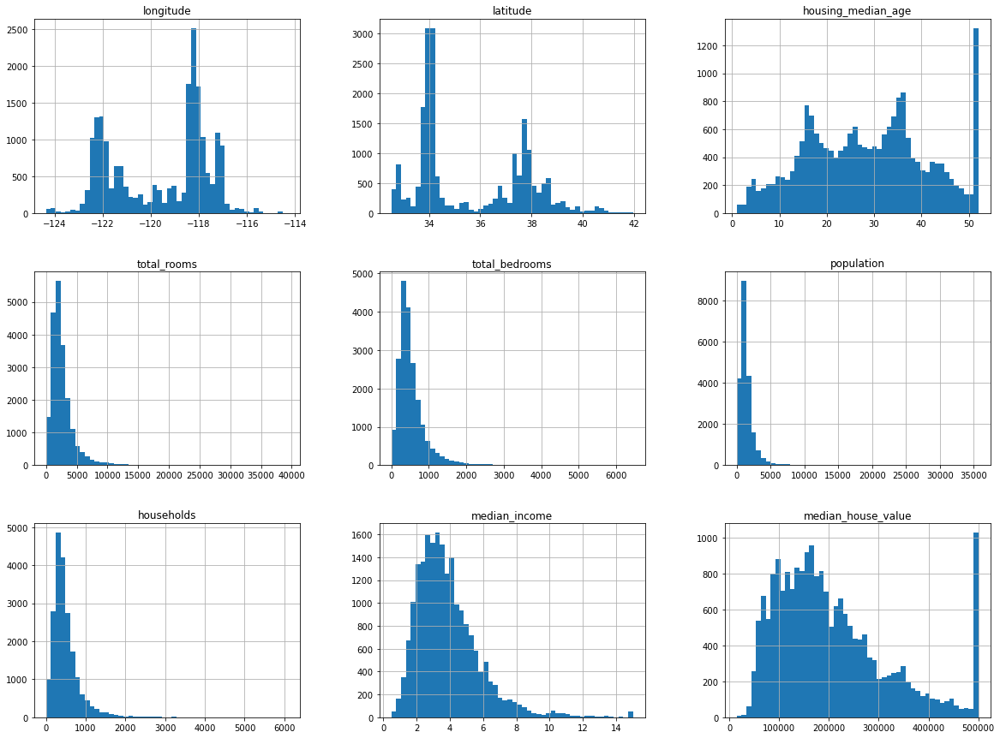

In [8]:
house.hist(bins=50, figsize=[20,15]);

In [9]:
house.isnull().sum()


longitude               1
latitude                1
housing_median_age      1
total_rooms             1
total_bedrooms        208
population              1
households              1
median_income           1
median_house_value      1
ocean_proximity         1
dtype: int64

In [10]:
#lets drop the line with all NaN
house.dropna(subset=['longitude'],axis=0,inplace=True)

In [11]:
#Creating a manual train_test_split ! Just for fun!
def split_train_test_no_target(data, test_size,random_state=42):
    random_state=np.random.seed(random_state)
    shuffled_indices = np.random.permutation(len(data))
    test_set_size = int(len(data) * test_size)
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    return data.iloc[train_indices],data.iloc[test_indices]

In [12]:
train_set, test_set = split_train_test_no_target(house, 0.2)

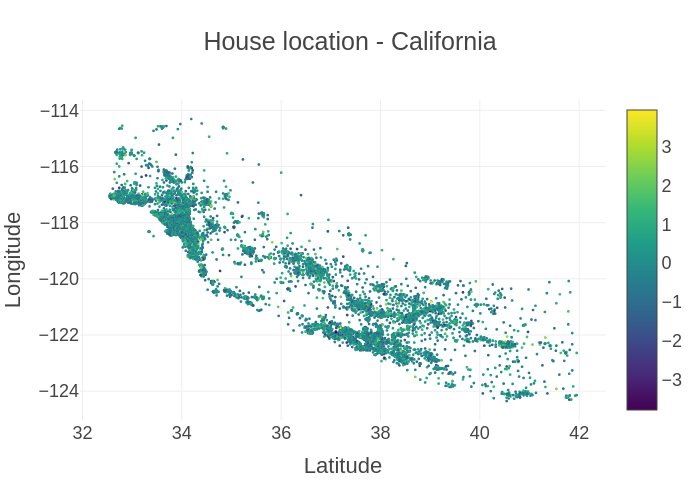

In [13]:
#let's research for correlations!
fig_ = go.Scatter(
    y = house.longitude,
    x = house.latitude,
    mode='markers',
    marker=dict(
        size=2.8,
        color=np.random.randn(len(house)), #set color equal to a variable
        colorscale='Viridis', # one of plotly colorscales
        showscale=True,
    )
)

layout = go.Layout(hovermode= 'closest', title = 'House location - California' , xaxis = dict(title = 'Latitude'), yaxis = dict(title = 'Longitude'),template= "presentation")
fig = go.Figure(data = [fig_], layout=layout)
fig.show()
img_bytes = fig.to_image(format="png")
Image(img_bytes)

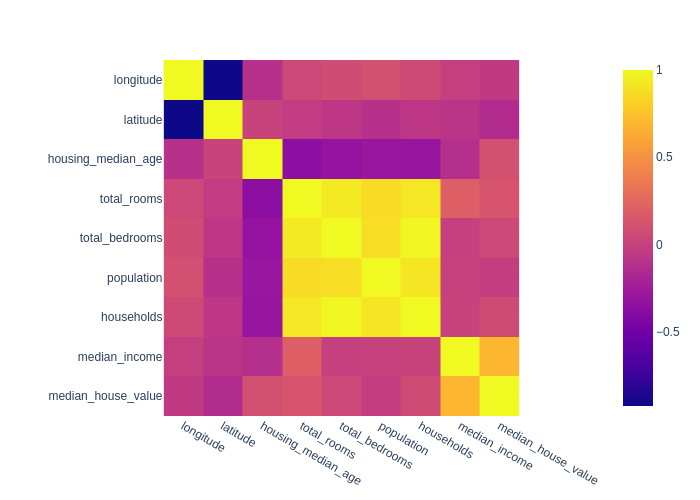

In [14]:
import plotly.express as px
#Lets see correlation heatmap!
fig = px.imshow(house.corr())
fig.show()
img_bytes = fig.to_image(format="png")
Image(img_bytes)

In [15]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.7+ MB


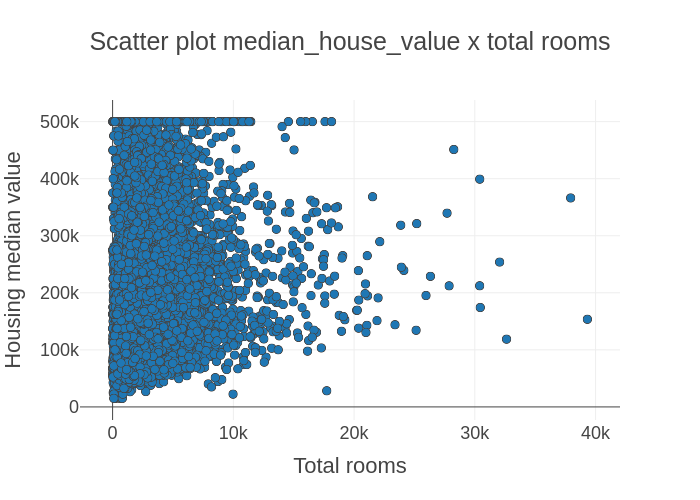

In [16]:
fig_sc1 = go.Scattergl(
    y = house.median_house_value,
    x = house.total_rooms, 
    mode='markers',
    marker=dict(
        #color=np.random.randn(N),
        colorscale='Viridis',
        line_width=1
    )
)

layout = go.Layout(hovermode= 'closest', title = 'Scatter plot median_house_value x total rooms' , yaxis = dict(title = 'Housing median value'), xaxis = dict(title = 'Total rooms'),template= "presentation")
fig = go.Figure(data = [fig_sc1], layout=layout)
fig.show()
img_bytes = fig.to_image(format="png")
Image(img_bytes)

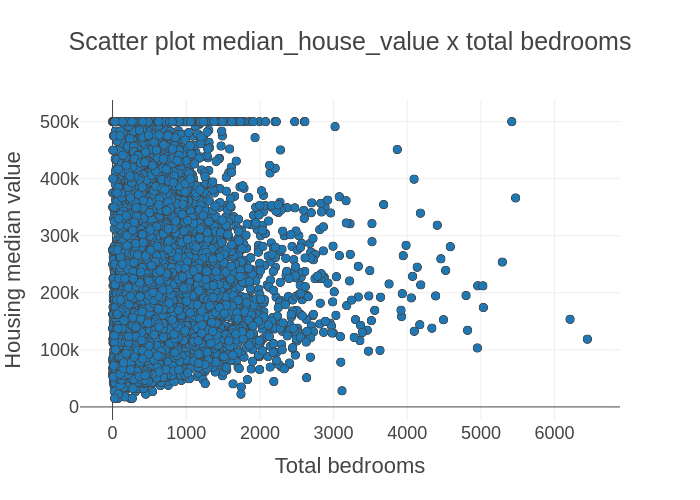

In [17]:
fig_sc2 = go.Scattergl(
    y = house.median_house_value,
    x = house.total_bedrooms, 
    mode='markers',
    marker=dict(
        #color=np.random.randn(N),
        colorscale='Viridis',
        line_width=1
    )
)

layout = go.Layout(hovermode= 'closest', title = 'Scatter plot median_house_value x total bedrooms' , yaxis = dict(title = 'Housing median value'), xaxis = dict(title = 'Total bedrooms'),template= "presentation")
fig = go.Figure(data = [fig_sc2], layout=layout)
fig.show()
img_bytes = fig.to_image(format="png")
Image(img_bytes)

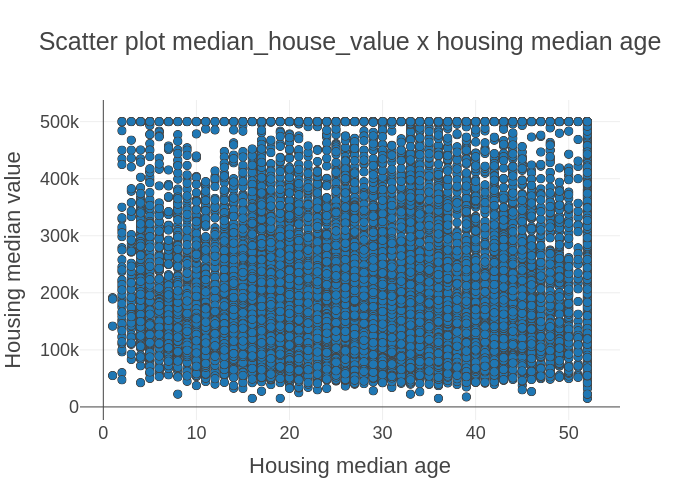

In [18]:
fig_sc1 = go.Scattergl(
    y = house.median_house_value,
    x = house.housing_median_age, 
    mode='markers',
    marker=dict(
        #color=np.random.randn(N),
        colorscale='Viridis',
        line_width=1
    )
)

layout = go.Layout(hovermode= 'closest', title = 'Scatter plot median_house_value x housing median age' , yaxis = dict(title = 'Housing median value'), xaxis = dict(title = 'Housing median age'),template= "presentation")
fig = go.Figure(data = [fig_sc1], layout=layout)
fig.show()
img_bytes = fig.to_image(format="png")
Image(img_bytes)

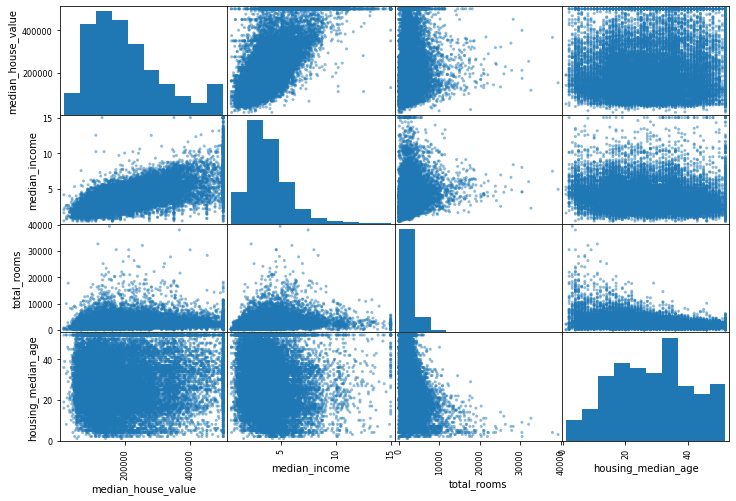

In [19]:
attributes = ['median_house_value','median_income','total_rooms','housing_median_age']
scatter_matrix(house[attributes],figsize=[12,8]);